In [14]:
%load_ext autoreload
%autoreload 2

from numcosmo_py import Ncm, Nc, GObject

from richness_mass_calib import create_richness_mass_calib
import numpy as np
import math
import sys
import os.path

from astropy.io import fits
from astropy.table import Table
from scipy import stats

import matplotlib.pyplot as plt

import pandas as pd

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
#Settings
Ncm.cfg_init()

%matplotlib inline
sys.path.insert(0, "/global/homes/c/cinlima/gcr-catalogs")
sys.path.insert(0, "/global/homes/c/cinlima/NumCosmo/notebooks/richness_proxy")


# DC2 data
DC2_halos_m200c = fits.open(
    "/global/cfs/projectdirs/lsst/groups/CL/cosmoDC2_v1.1.4/extragal/full/halos/halos_m200c_13.0.fits")

dt_halos = Table(DC2_halos_m200c[1].data)

lnM = np.log(dt_halos["m200c"])  # ln(mass)
z = dt_halos["redshift_true"]  # redshift
lnR = np.log(dt_halos["richness"])  # ln(richness)



def compute_res(rich_model):

    lnR_mean = np.array(
        [rich_model.get_mean_richness(lnM[i], z[i]) for i in range(len(dt_halos))]
    )
    lnR_std = np.array(
        [rich_model.get_std_richness(lnM[i], z[i]) for i in range(len(dt_halos))]
    )
    
    lnr_cut = np.array(
        [rich_model.get_cut(lnM[i], z[i]) for i in range(len(dt_halos))])

    abs_err = (lnR - lnR_mean) / lnR_std
    # Data cut
    sigma_cut = 5.0

    sigma_cut_array = np.abs(abs_err) < sigma_cut
    print(f"Cutting {sigma_cut}-sigma, {np.sum(np.logical_not(sigma_cut_array))}")

    lnR_mean = lnR_mean[sigma_cut_array]
    z_sigma_cut = z[sigma_cut_array]
    lnM_sigma_cut = lnM[sigma_cut_array]
    abs_err = abs_err[sigma_cut_array]
    lnR_ext = lnR[sigma_cut_array]
    lnr_cut = lnr_cut[sigma_cut_array] 
    
    return abs_err, lnR_mean, z_sigma_cut, lnM_sigma_cut, lnr_cut, lnR_ext 


In [4]:
# redshift bins
z_0 = 0.0
z_1 = 0.1
halos_bin_z =[]

for i in range(30):
    cut_z = np.logical_and (dt_halos['redshift_true'] > z_0, dt_halos['redshift_true'] < z_1)
    halos_bin_z.append(dt_halos[cut_z])
    z_0 = z_0 + 0.1
    z_1 = z_1 + 0.1

# mass bins
label = []
halos_bin_mz =[]
for i in range(30):
    lnM_0 = min(lnM)
    lnM_1 = min(lnM) + 0.5

    for j in range(9):
        cut = np.logical_and (np.log(halos_bin_z[i]["m200c"]) > lnM_0, np.log(halos_bin_z[i]["m200c"]) < lnM_1)
        halos_bin_mz.append(halos_bin_z[i][cut])
        label.append(f"{min(halos_bin_z[i]['redshift_true']):.3f} < z < {max(halos_bin_z[i]['redshift_true']):.3f}\n{lnM_0:.3f} < lnM < {lnM_1:.3f}")
        lnM_0 = lnM_0 + 0.5
        lnM_1 = lnM_1 + 0.5

In [5]:
fit_results_ascaso = []
fit_results_ext = []

mean_ext_list=[]

for i in range(len(halos_bin_mz)):
    
    if len(halos_bin_mz[i]) == 0:
        fit_results_ascaso.append(([], [], [], [], [] ,[]))
        fit_results_ext.append(([], [], [], [], [] ,[]))

    
    else:
        rmdata = create_richness_mass_calib(halos_bin_mz[i])

        use_ascaso = False

        ascaso = Nc.ClusterMassAscaso()

        ascaso.param_set_by_name("mup0", 4.45393539397061)
        # ascaso.param_set_by_name("mup1", 0.688627943224023)
        # ascaso.param_set_by_name("mup2", 1.23735536845047)
        # ascaso.param_set_by_name("sigmap0", 0.227197277810533)
        # ascaso.param_set_by_name("sigmap1", -0.0514034833229222)
        # ascaso.param_set_by_name("sigmap2", -0.125446104089159)
        ascaso.param_set_by_name("cut", 1e15)
        
        ascaso.param_set_by_name("mup1", 0.0)
        ascaso.param_set_by_name("mup2", 0.0)
        ascaso.param_set_by_name("sigmap0", 0.227197277810533)
        ascaso.param_set_by_name("sigmap1", 0.0)
        ascaso.param_set_by_name("sigmap2", 0.0)


        ascaso.param_set_ftype(0, Ncm.ParamType.FREE)
        ascaso.param_set_ftype(1, Ncm.ParamType.FIXED)
        ascaso.param_set_ftype(2, Ncm.ParamType.FIXED)
        ascaso.param_set_ftype(3, Ncm.ParamType.FREE)
        ascaso.param_set_ftype(4, Ncm.ParamType.FIXED)
        ascaso.param_set_ftype(5, Ncm.ParamType.FIXED)
        ascaso.param_set_ftype(6, Ncm.ParamType.FIXED)

        lnrich_ext = Nc.ClusterMassLnrichExt()
        lnrich_ext.param_set_by_name("mu", 4.60456407051582)
        # lnrich_ext.param_set_by_name("muM1", 0.872079943089853)
        # lnrich_ext.param_set_by_name("muZ1", 1.77432682440775)
        # lnrich_ext.param_set_by_name("muM2", 0.0417736274804596)
        # lnrich_ext.param_set_by_name("muZ2", -0.140721577418961)
        # lnrich_ext.param_set_by_name("muMZ", 0.142254333837774)
        
        lnrich_ext.param_set_by_name("muM1", 0.0)
        lnrich_ext.param_set_by_name("muZ1", 0.0)
        lnrich_ext.param_set_by_name("muM2", 0.0)
        lnrich_ext.param_set_by_name("muZ2", 0.0)
        lnrich_ext.param_set_by_name("muMZ", 0.0)
        
        lnrich_ext.param_set_by_name("sigma0", 0.288099083637692)
#         lnrich_ext.param_set_by_name("sigmaM1", 0.01665425603827)
#         lnrich_ext.param_set_by_name("sigmaZ1", -0.0170544925340452)
#         lnrich_ext.param_set_by_name("sigmaM2", 0.0151710348889877)
#         lnrich_ext.param_set_by_name("sigmaZ2", 0.00841242091702829)
#         lnrich_ext.param_set_by_name("sigmaMZ", 0.0375086602261856)
        
        lnrich_ext.param_set_by_name("sigmaM1", 0.0)
        lnrich_ext.param_set_by_name("sigmaZ1", 0.0)
        lnrich_ext.param_set_by_name("sigmaM2", 0.0)
        lnrich_ext.param_set_by_name("sigmaZ2", 0.0)
        lnrich_ext.param_set_by_name("sigmaMZ", 0.0)


        lnrich_ext.param_set_by_name("cut", 1e15)
        lnrich_ext.param_set_by_name("cutM1", 0)
        lnrich_ext.param_set_by_name("cutZ1", 0)


        lnrich_ext.param_set_ftype(0, Ncm.ParamType.FREE)
        lnrich_ext.param_set_ftype(1, Ncm.ParamType.FIXED)
        lnrich_ext.param_set_ftype(2, Ncm.ParamType.FIXED)
        lnrich_ext.param_set_ftype(3, Ncm.ParamType.FIXED)
        lnrich_ext.param_set_ftype(4, Ncm.ParamType.FIXED)
        lnrich_ext.param_set_ftype(5, Ncm.ParamType.FIXED)
        lnrich_ext.param_set_ftype(6, Ncm.ParamType.FIXED)

        lnrich_ext.param_set_ftype(7, Ncm.ParamType.FREE)
        lnrich_ext.param_set_ftype(8, Ncm.ParamType.FIXED)
        lnrich_ext.param_set_ftype(9, Ncm.ParamType.FIXED)
        lnrich_ext.param_set_ftype(10, Ncm.ParamType.FIXED)
        lnrich_ext.param_set_ftype(11, Ncm.ParamType.FIXED)

        lnrich_ext.param_set_ftype(12, Ncm.ParamType.FIXED)
        lnrich_ext.param_set_ftype(13, Ncm.ParamType.FIXED)
        lnrich_ext.param_set_ftype(14, Ncm.ParamType.FIXED)

        mset_ascaso = Ncm.MSet()
        mset_ascaso.set(ascaso)

        mset_ext = Ncm.MSet()
        mset_ext.set(lnrich_ext)

        dset = Ncm.Dataset.new()
        dset.append_data(rmdata)

        lh = Ncm.Likelihood.new(dset)

        # mset_ascaso.param_set_all_ftype(Ncm.ParamType.FIXED)
        # mset_ext.param_set_all_ftype(Ncm.ParamType.FIXED)

        fit_ascaso = Ncm.Fit.new(
            Ncm.FitType.NLOPT, "ln-neldermead", lh, mset_ascaso, Ncm.FitGradType.NUMDIFF_CENTRAL)

        fit_ext = Ncm.Fit.new(
            Ncm.FitType.NLOPT, "ln-neldermead", lh, mset_ext, Ncm.FitGradType.NUMDIFF_CENTRAL)

        fit_ascaso.run_restart(Ncm.FitRunMsgs.SIMPLE, 1.0e-3, 0.0, None, None)
        fit_ext.run_restart(Ncm.FitRunMsgs.SIMPLE, 1.0e-3, 0.0, None, None)
        
        
        dt_halos = halos_bin_mz[i]
        lnM = np.log(dt_halos["m200c"])  # ln(mass)
        z = dt_halos["redshift_true"]  # redshift
        lnR = np.log(dt_halos["richness"])  # ln(richness)

        res_ascaso, lnR_mean_ascaso, z_sigma_cut_ascaso, lnM_sigma_cut_ascaso, lnr_cut_ascaso, lnR_ascaso  = compute_res(ascaso)

        res_ext, lnR_mean_ext, z_sigma_cut_ext, lnM_sigma_cut_ext, lnr_cut_ext, lnR_ext  = compute_res(lnrich_ext)

        fit_results_ascaso.append((res_ascaso, lnR_mean_ascaso, z_sigma_cut_ascaso, lnM_sigma_cut_ascaso, lnr_cut_ascaso, lnR_ascaso))
        fit_results_ext.append((res_ext, lnR_mean_ext, z_sigma_cut_ext, lnM_sigma_cut_ext, lnr_cut_ext, lnR_ext))
        mean_ext_list.append(lnR_mean_ext)


#----------------------------------------------------------------------------------
# Model fitting. Interating using:
#  - solver:            NLOpt:ln-neldermead
#  - differentiation:   Numerical differentiantion (central)
#.................
#  Minimum found with precision: |df|/f =  1.00000e-08 and |dx| =  1.00000e-05
#  Elapsed time: 00 days, 00:00:00.0007360
#  iteration            [000081]
#  function evaluations [000083]
#  gradient evaluations [000000]
#  degrees of freedom   [000167]
#  m2lnL     =     134.276741619888 (     134.27674 )
#  Fit parameters:
#     1.57814408555312     0.451187951631736   
#----------------------------------------------------------------------------------
# Restarting:              yes
#  - absolute improvement: 27341.940837573       
#  - relative improvement: 0.995112983028582     
#  - m2lnL_0  :            27476.2175791929      
#  - m2lnL_1  :            134.276741619888      
#------------------------------------------------------------------

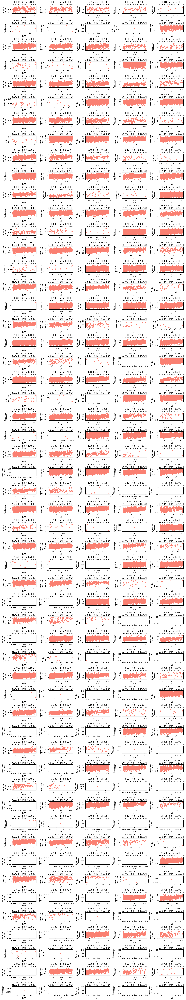

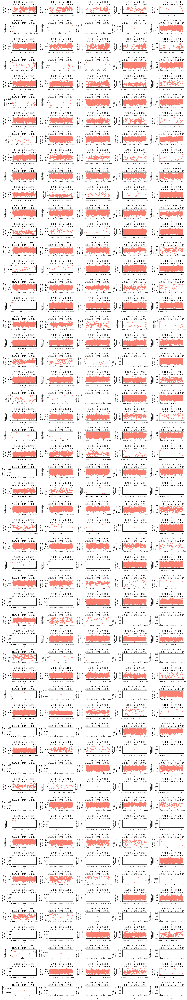

In [6]:
#Resíduos binnados: Ascaso

#lnM 

fig = plt.figure(figsize=(20,150))
plt.subplots_adjust(wspace=0.5, 
                    hspace=1.5)


for i in range(len(fit_results_ascaso)): 
    
        t=i+1

        axt = fig.add_subplot(70,5,t)


        axt.scatter(fit_results_ascaso[i][3], fit_results_ascaso[i][0], c="salmon")
        axt.set_xlabel("$\ln M$", fontsize=12)
        axt.set_ylabel("Resíduos:\nAscaso", fontsize=12)
        axt.set_title(label[i],fontsize=14)
    

##plt.savefig('Figures/Res_Ascaso_lnM_1.png', format='png')


# z 

fig = plt.figure(figsize=(20,150))
plt.subplots_adjust(wspace=0.5, 
                    hspace=1.5)


for i in range(len(fit_results_ascaso)): 
    
        t=i+1

        axt = fig.add_subplot(70,5,t)


        axt.scatter(fit_results_ascaso[i][2], fit_results_ascaso[i][0], c="salmon")
        axt.set_xlabel("$z$", fontsize=12)
        axt.set_ylabel("Resíduos:\nAscaso", fontsize=12)
        axt.set_title(label[i],fontsize=14)
    

#plt.savefig('Figures/Res_Ascaso_z_1.png', format='png')



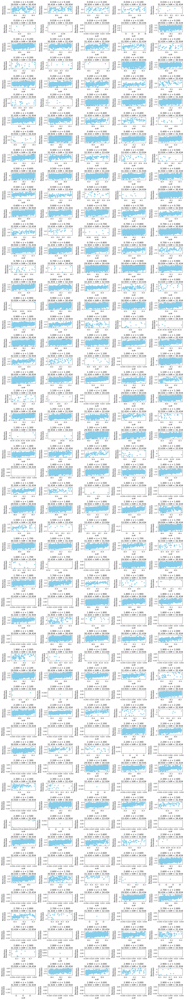

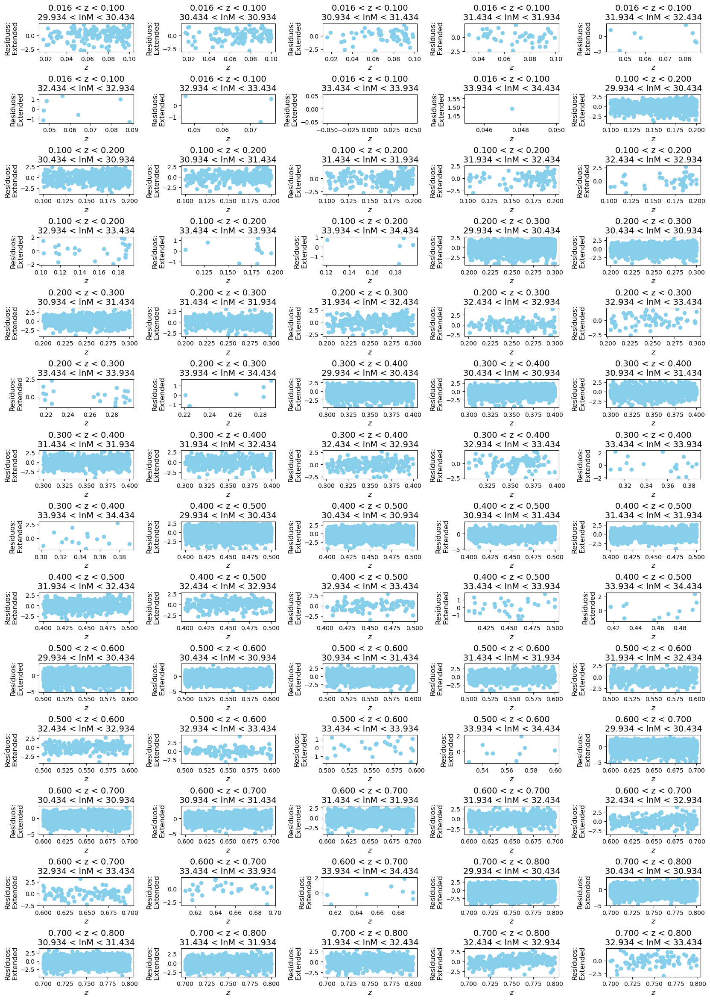

In [7]:
#Resíduos binnados: Ext

#lnM - Parte1

fig = plt.figure(figsize=(20,150))
plt.subplots_adjust(wspace=0.5, 
                    hspace=1.5)


for i in range(len(fit_results_ext)): 
    
        t=i+1

        axt = fig.add_subplot(70,5,t)


        axt.scatter(fit_results_ext[i][3], fit_results_ext[i][0], c="skyblue")
        axt.set_xlabel("$\ln M$", fontsize=12)
        axt.set_ylabel("Resíduos:\nExtended", fontsize=12)
        axt.set_title(label[i],fontsize=14)
    

#plt.savefig('Figures/Res_Extended_lnM_1.png', format='png')

# z

fig = plt.figure(figsize=(20,150))
plt.subplots_adjust(wspace=0.5, 
                    hspace=1.5)


for i in range(70): 
    
        t=i+1

        axt = fig.add_subplot(70,5,t)


        axt.scatter(fit_results_ext[i][2], fit_results_ext[i][0], c="skyblue")
        axt.set_xlabel("$z$", fontsize=12)
        axt.set_ylabel("Resíduos:\nExtended", fontsize=12)
        axt.set_title(label[i],fontsize=14)
    

#plt.savefig('Figures/Res_Extended_z_1.png', format='png')



/global/homes/c/cinlima/.conda/envs/numcosmo/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/global/homes/c/cinlima/.conda/envs/numcosmo/lib/python3.11/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/global/homes/c/cinlima/.conda/envs/numcosmo/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/global/homes/c/cinlima/.conda/envs/numcosmo/lib/python3.11/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/global/homes/c/cinlima/.conda/envs/numcosmo/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret 

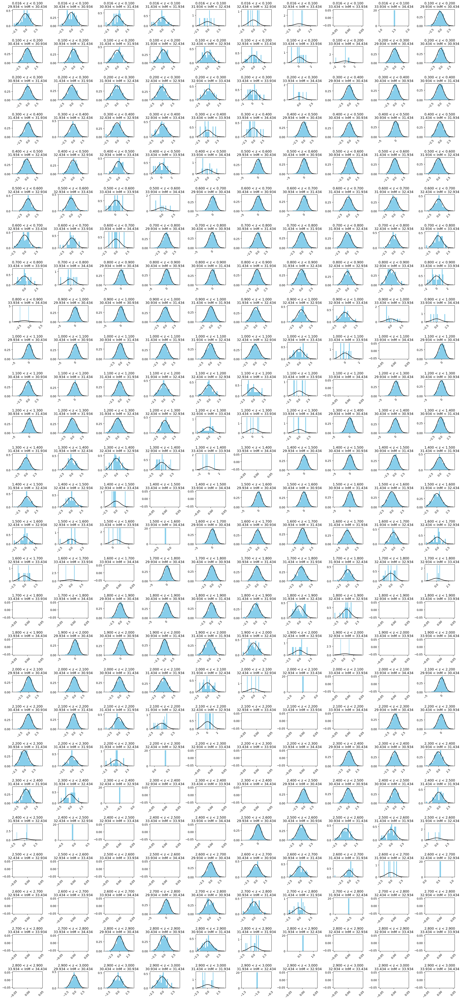

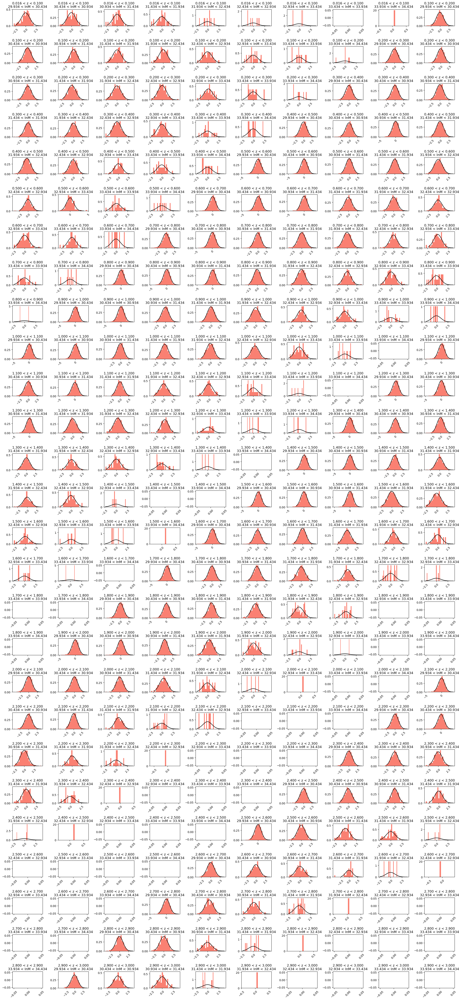

In [8]:
#Ext
res_ext_m = [i for i, j, k, l, m, n in fit_results_ext]
res_ascaso_m = [i for i, j, k, l, m, n in fit_results_ascaso]
    
fig, axs = plt.subplots(nrows=27, ncols=10,figsize=(23,50))


for res_ext, ax, i in zip(res_ext_m, axs.flat, range(len(res_ext_m))):
    
    points = np.linspace(stats.norm.ppf(0.01,loc=np.mean(res_ext),scale=np.std(res_ext)),
                 stats.norm.ppf(0.9999,loc=np.mean(res_ext),scale=np.std(res_ext)),100)
    
    
    ax.hist(res_ext, bins=20, density=True, color='skyblue')
    ax.plot(points, stats.norm.pdf(points, np.mean(res_ext), np.std(res_ext)), color='black')

    ax.tick_params(axis='x', labelrotation = 45)
    ax.set_title(label[i],fontsize=12)
    
fig.tight_layout()
#plt.savefig('Figures/Res_Extended_hist.png', format='png')


#Ascaso
fig, axs = plt.subplots(nrows=27, ncols=10,figsize=(23,50))


for res_asc, ax, i in zip(res_ascaso_m, axs.flat, range(len(res_ext_m))):
    
    points = np.linspace(stats.norm.ppf(0.01,loc=np.mean(res_asc),scale=np.std(res_asc)),
                 stats.norm.ppf(0.9999,loc=np.mean(res_asc),scale=np.std(res_asc)),100)
    
    
    ax.hist(res_asc, bins=20, density=True, color='salmon')
    ax.plot(points, stats.norm.pdf(points, np.mean(res_asc), np.std(res_asc)), color='black')

    ax.tick_params(axis='x', labelrotation = 45)
    ax.set_title(label[i],fontsize=12)
fig.tight_layout()
#plt.savefig('Figures/Res_Ascaso_hist.png', format='png')


In [9]:
# fig, axs = plt.subplots(nrows=45, ncols=5, figsize=(12,70))

# for res_ext, ax in zip(res_ascaso_m, axs.flat):
    
#     points = np.linspace(stats.norm.ppf(0.01,loc=np.mean(res_ext),scale=np.std(res_ext)),
#                  stats.norm.ppf(0.9999,loc=np.mean(res_ext),scale=np.std(res_ext)),100)
    
#     ax.hist(res_ext, bins=20, density=True)
#     ax.plot(points, stats.norm.pdf(points, np.mean(res_ext), np.std(res_ext)), color='r')
#     ax.tick_params(axis='x', labelrotation = 45)
# fig.tight_layout()

# plt.show()


In [10]:

p_value_res_SW=[]
p_value_res_KS=[]

for res_i in res_ascaso_m:
    
    if len(res_i) < 5:
        pass
    
    elif len(res_i) > 50:
        pvalue=stats.kstest(res_i, stats.norm.cdf, args=(np.mean(res_i), np.std(res_i))).pvalue
        p_value_res_KS.append(pvalue)
        
    else:
        pvalue=stats.shapiro(res_i).pvalue
        p_value_res_SW.append(pvalue)

porc_SW = len([p for p in p_value_res_SW if p > 0.05]) / len(p_value_res_SW)   * 100
porc_KS = len([p for p in p_value_res_KS if p > 0.05]) / len(p_value_res_KS)   * 100


print(f"Ascaso bins (> 5 elements) - Normality tests: \nKS-Test:{porc_KS:.2f}% \nSW-Test:{porc_SW:.2f}%")

Ascaso bins (> 5 elements) - Normality tests: 
KS-Test:64.33% 
SW-Test:77.08%


In [11]:
p_value_ext_SW=[]
p_value_ext_KS=[]

for res_i in res_ext_m:
    
    if len(res_i) < 5:
        pass
    
    elif len(res_i) > 50:
        pvalue=stats.kstest(res_i, stats.norm.cdf, args=(np.mean(res_i), np.std(res_i))).pvalue
        p_value_ext_KS.append(pvalue)
        
    else:
        pvalue=stats.shapiro(res_i).pvalue
        p_value_ext_SW.append(pvalue)

porc_SW_ext = len([p for p in p_value_ext_SW if p > 0.05]) / len(p_value_ext_SW)   * 100
porc_KS_ext = len([p for p in p_value_ext_KS if p > 0.05]) / len(p_value_ext_KS)   * 100

print(f"Ascaso bins (> 5 elements) - Normality tests: \nKS-Test:{porc_KS_ext:.2f}% \nSW-Test:{porc_SW_ext:.2f}%")

Ascaso bins (> 5 elements) - Normality tests: 
KS-Test:64.97% 
SW-Test:79.17%


In [114]:
mu0_ascaso = [j for i, j, k, l, m, n in fit_results_ascaso if len(j)>0]

mean_z_ascaso = [k for i, j, k, l, m, n in fit_results_ascaso if len(k) > 0]

mean_lnM_ascaso = [l for i, j, k, l, m, n in fit_results_ascaso if len(l) > 0]


In [107]:
mu0 = np.concatenate(mu0_ascaso,  axis=None)
m_z = np.concatenate(mean_z_ascaso,  axis=None)
m_lnM = np.concatenate(mean_lnM_ascaso,  axis=None)

Text(0, 0.5, 'mu0')

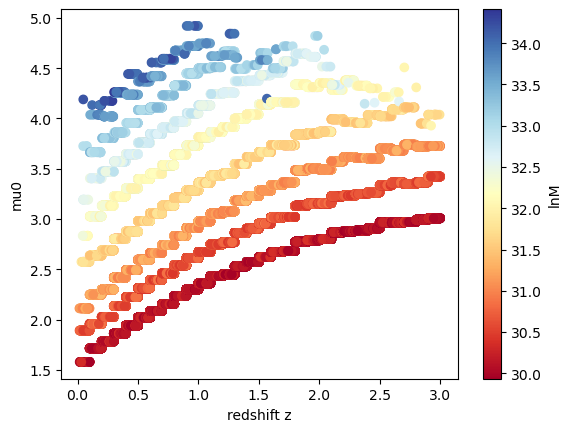

In [108]:
plt.scatter(m_z, mu0 , c=m_lnM, cmap='RdYlBu')
plt.colorbar(label='lnM')

plt.xlabel('redshift z')
plt.ylabel('mu0')

Text(0, 0.5, 'mu0')

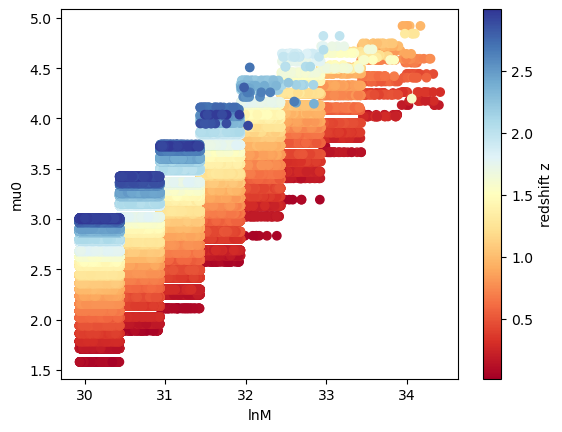

In [129]:
plt.scatter(m_lnM, mu0 , c= m_z, cmap='RdYlBu')
plt.colorbar(label='redshift z')

plt.xlabel('lnM')
plt.ylabel('mu0')

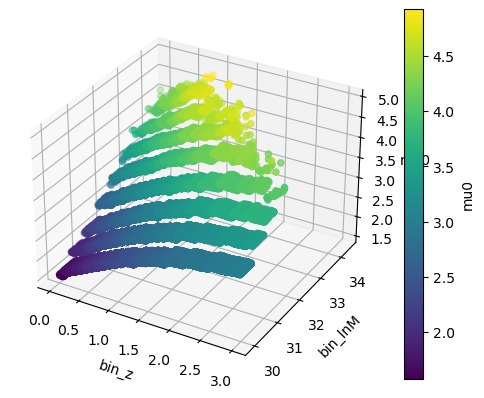

In [113]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

xs = m_z
ys = m_lnM
zs = mu0


p=ax.scatter(xs, ys, zs, c=zs)
#ax.contourf(xs, ys, zs)


ax.set_xlabel('bin_z')
ax.set_ylabel('bin_lnM')
ax.set_zlabel('mu0')

fig.colorbar(p, ax=ax, label='mu0')

plt.show()

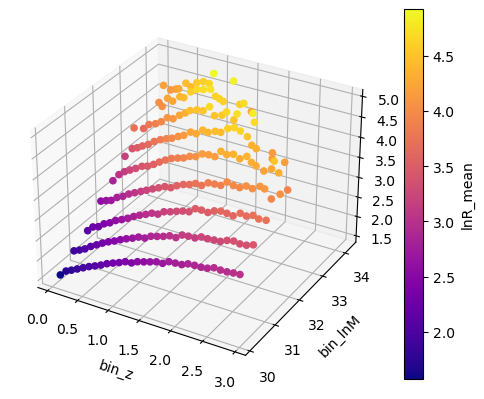

In [128]:
m_lnR = [np.mean(n) for i, j, k, l, m, n in fit_results_ascaso if len(j)>0]
media_z= [np.mean(k) for i, j, k, l, m, n in fit_results_ascaso if len(k) > 0]
media_lnM = [np.mean(l) for i, j, k, l, m, n in fit_results_ascaso if len(k) > 0]

fig = plt.figure()
ax = fig.add_subplot(projection='3d')

p=ax.scatter(media_z, media_lnM, m_lnR, c=m_lnR, cmap='plasma', alpha=1.0)


ax.set_xlabel('bin_z')
ax.set_ylabel('bin_lnM')
ax.set_zlabel('lnR_mean')

fig.colorbar(p, ax=ax, label='lnR_mean')

plt.show()

Text(0, 0.5, 'lnR_mean')

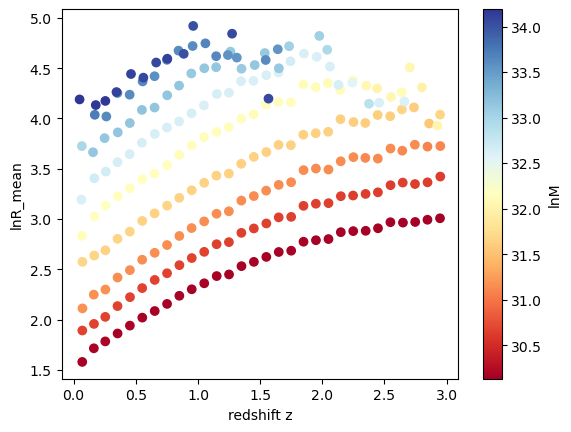

In [130]:
plt.scatter(media_z, m_lnR , c=media_lnM, cmap='RdYlBu')
plt.colorbar(label='lnM')

plt.xlabel('redshift z')
plt.ylabel('lnR_mean')


Text(0, 0.5, 'lnR_mean')

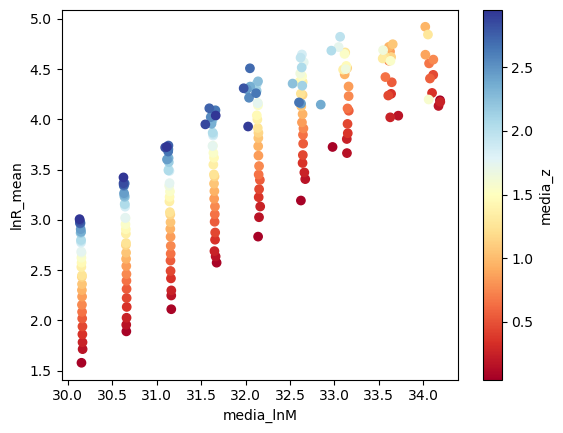

In [133]:
plt.scatter(media_lnM, m_lnR , c=media_z, cmap='RdYlBu')
plt.colorbar(label='media_z')

plt.xlabel('media_lnM')
plt.ylabel('lnR_mean')
